In [1]:
import numpy as np
import tensorflow as tf
import pathlib
import matplotlib.pyplot as plt

2022-10-02 11:05:46.217535: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-02 11:05:46.309650: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-02 11:05:46.309664: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-10-02 11:05:46.331699: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-02 11:05:46.774093: W tensorflow/stream_executor/platform/de

In [2]:
IMG_SHAPE = (150, 150)

saved_model = tf.keras.models.load_model('../SavedModel/')

dataset_dir = pathlib.Path('../dataset')

dataset_test_dir = list(dataset_dir.glob('test/*'))

class_names = ['building', 'forest', 'glacier', 'mountain', 'sea', 'street']

2022-10-02 11:05:47.594557: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-10-02 11:05:47.594578: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-02 11:05:47.594591: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (fabio-XPS-15-7590): /proc/driver/nvidia/version does not exist
2022-10-02 11:05:47.594727: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Prediction On New Data

In [3]:
for i in range(9):
    path_to_file = str(dataset_test_dir[i])
    img = tf.keras.utils.load_img(path_to_file, target_size=IMG_SHAPE)
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = saved_model.predict(img_array)
    score = tf.nn.softmax(predictions[0])
    print("This image most likely belongs to {} with a {:.2f} percent confidence."
          .format(class_names[np.argmax(score)], 100 * np.max(score)))

1/1 [==============================] - 1s 1s/step
This image most likely belongs to street with a 99.91 percent confidence.
1/1 [==============================] - 0s 45ms/step
This image most likely belongs to mountain with a 94.37 percent confidence.
1/1 [==============================] - 0s 42ms/step
This image most likely belongs to street with a 99.92 percent confidence.
1/1 [==============================] - 0s 49ms/step
This image most likely belongs to glacier with a 70.56 percent confidence.
1/1 [==============================] - 0s 43ms/step
This image most likely belongs to building with a 99.47 percent confidence.
1/1 [==============================] - 0s 45ms/step
This image most likely belongs to sea with a 100.00 percent confidence.
1/1 [==============================] - 0s 41ms/step
This image most likely belongs to sea with a 99.77 percent confidence.
1/1 [==============================] - 0s 44ms/step
This image most likely belongs to forest with a 99.99 percent confid

In [4]:
def make_predictions(index):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        path_to_file = str(dataset_test_dir[i + index])
        img = tf.keras.utils.load_img(path_to_file, target_size=(150, 150))
        img_array = tf.keras.utils.img_to_array(img)
        plt.imshow(img_array.astype("uint8"))
        img_array = tf.expand_dims(img_array, 0)
        predictions = saved_model.predict(img_array)
        score = tf.nn.softmax(predictions[0])
        plt.title(class_names[np.argmax(score)])
        plt.axis("off")

1/1 [==============================] - 0s 39ms/step


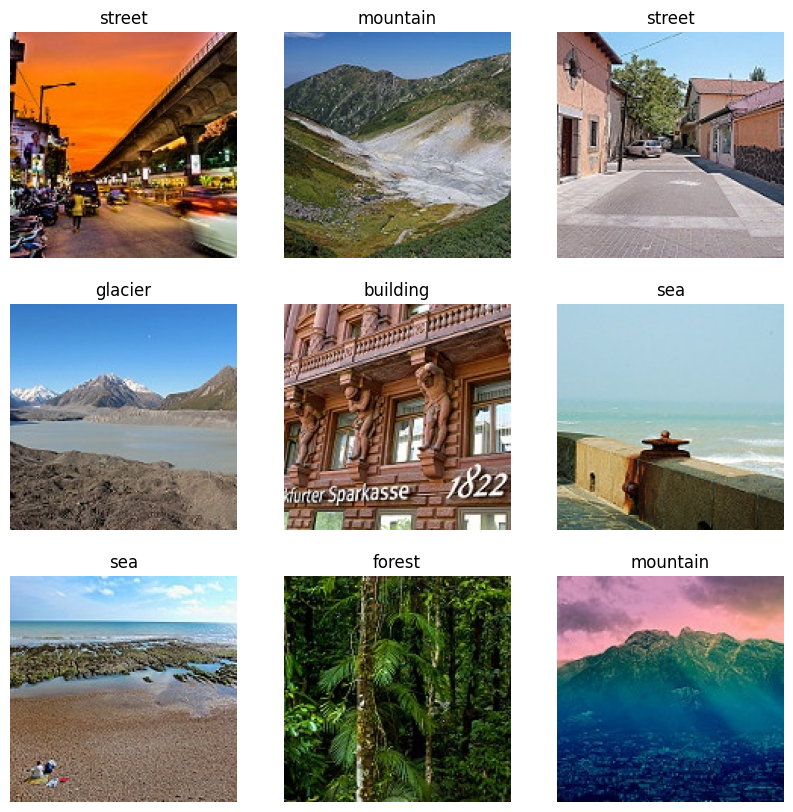

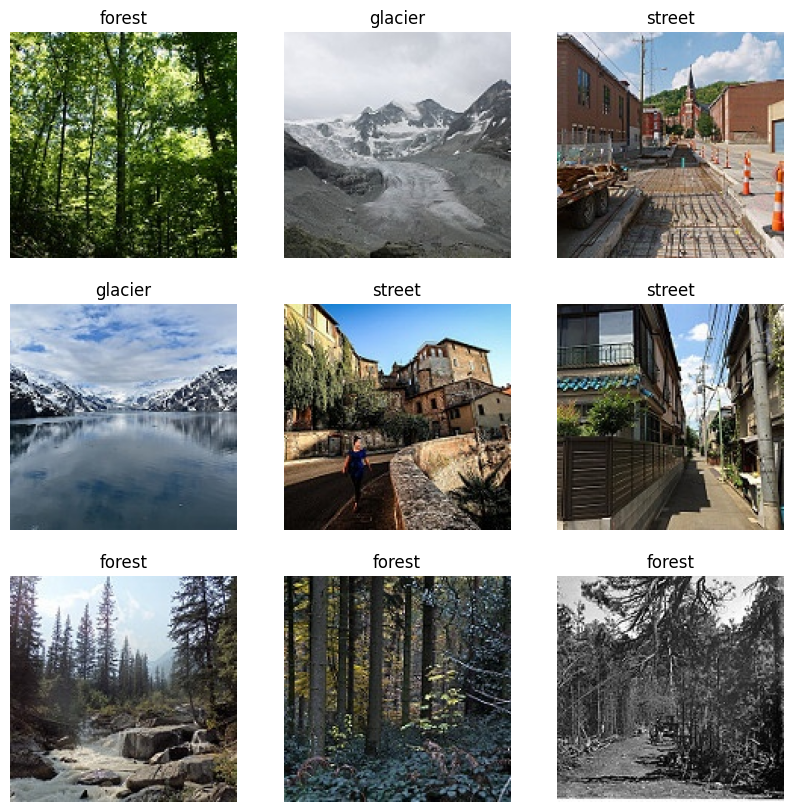

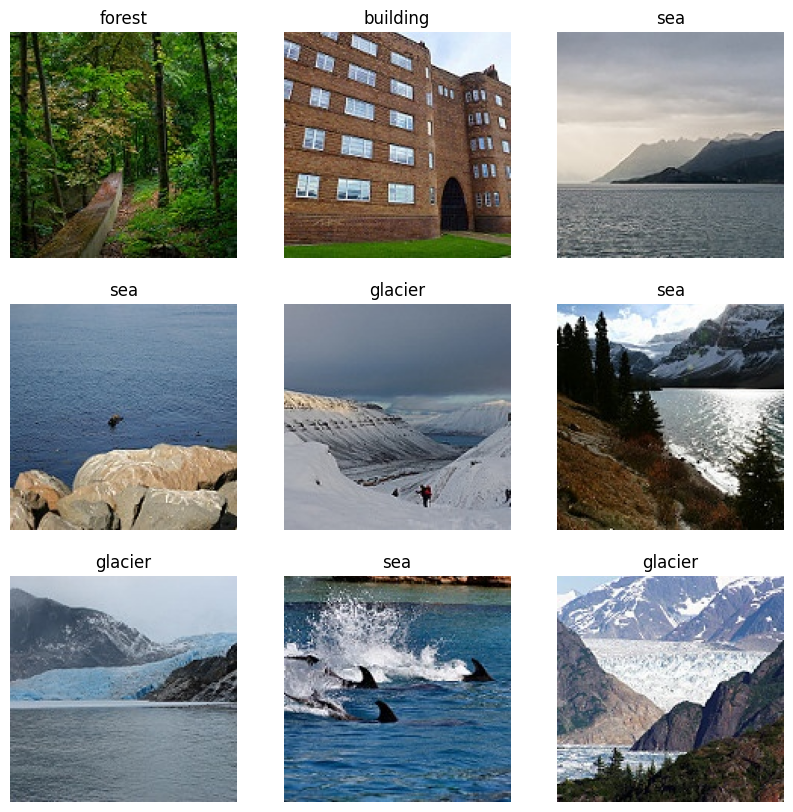

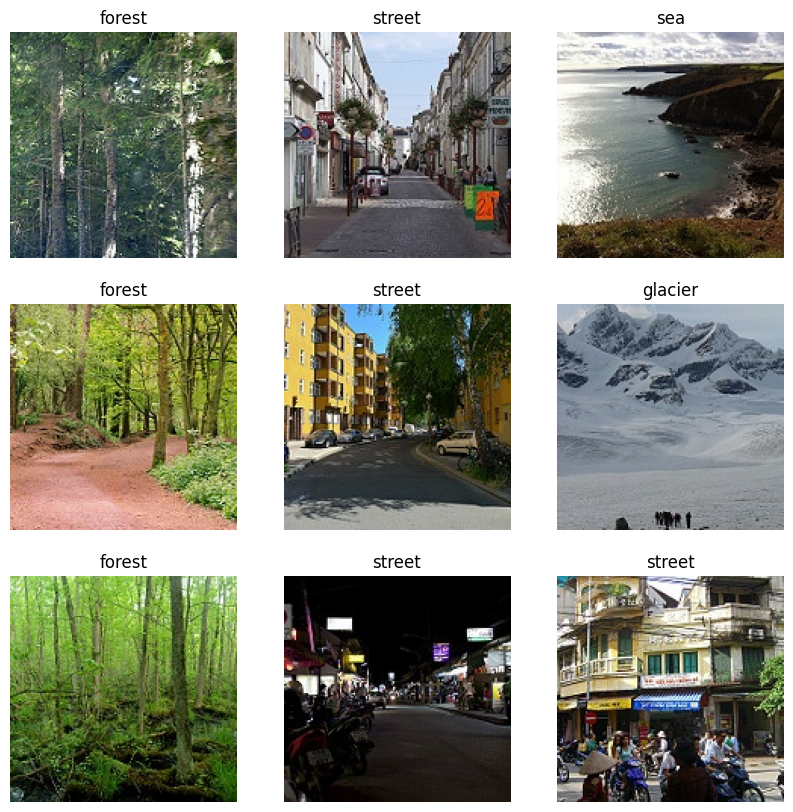

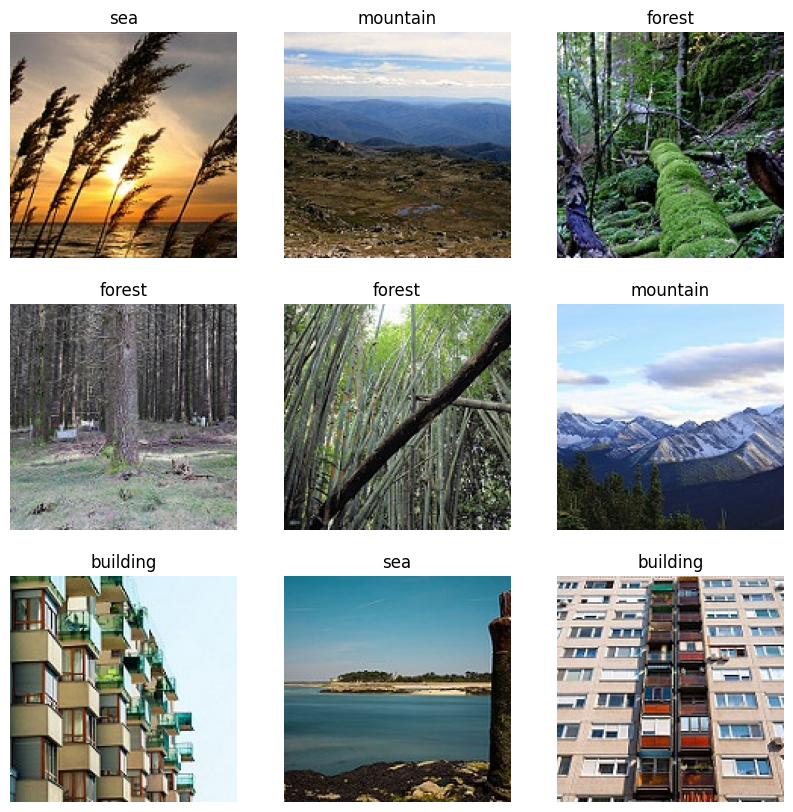

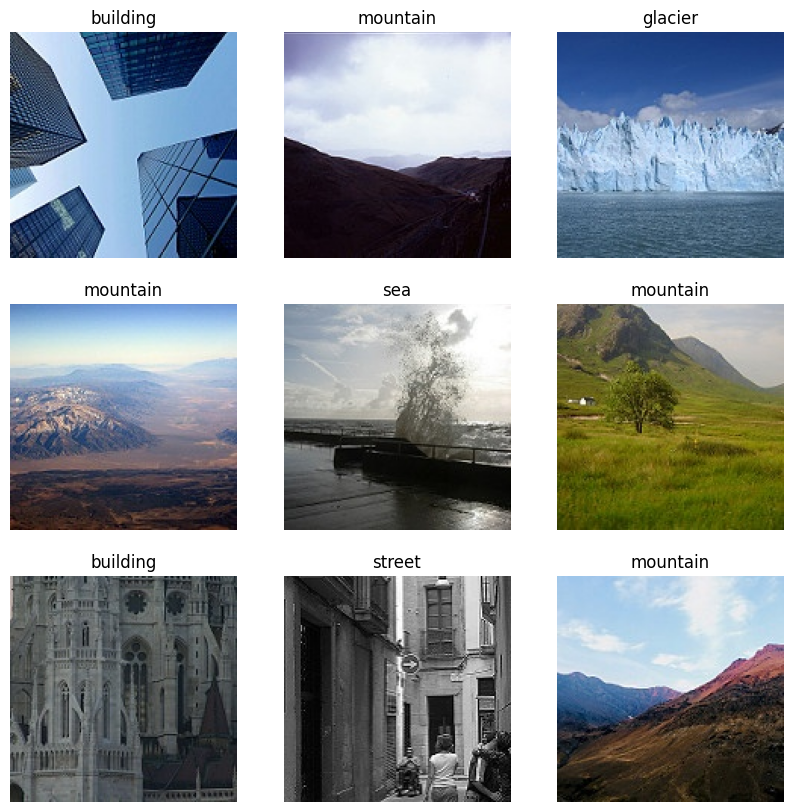

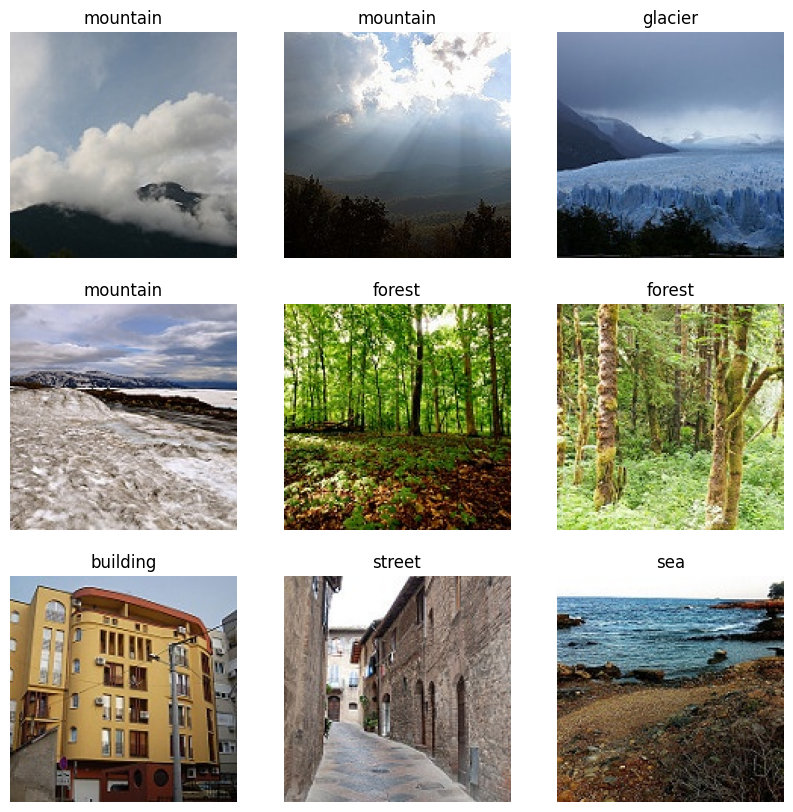

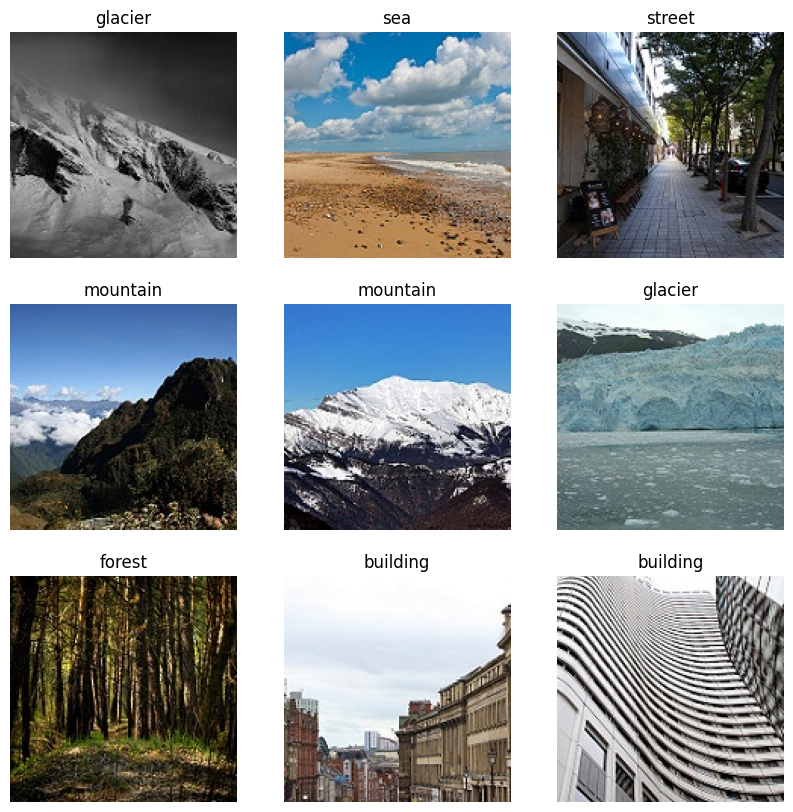

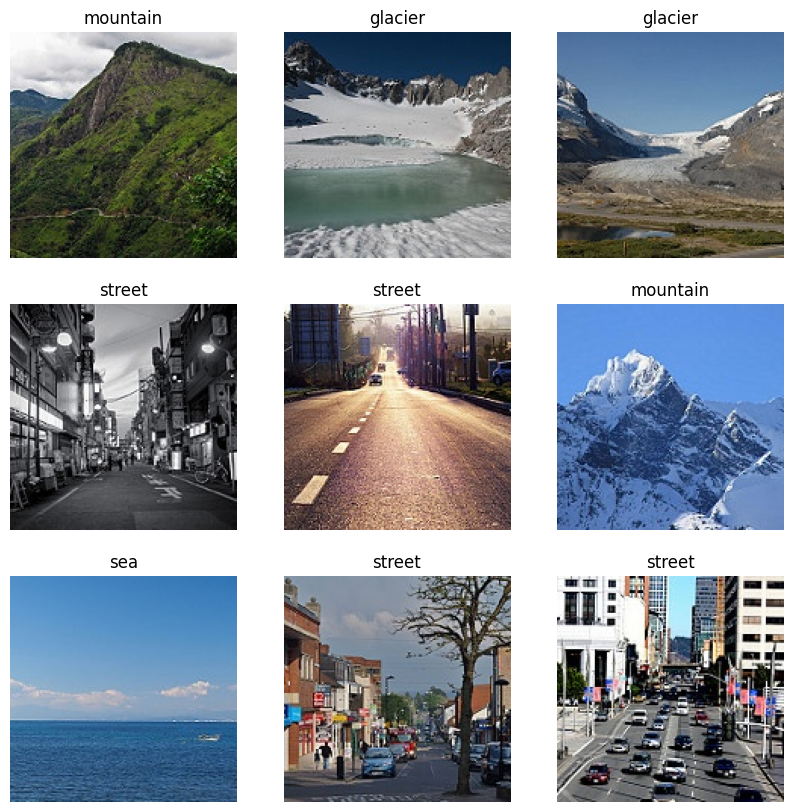

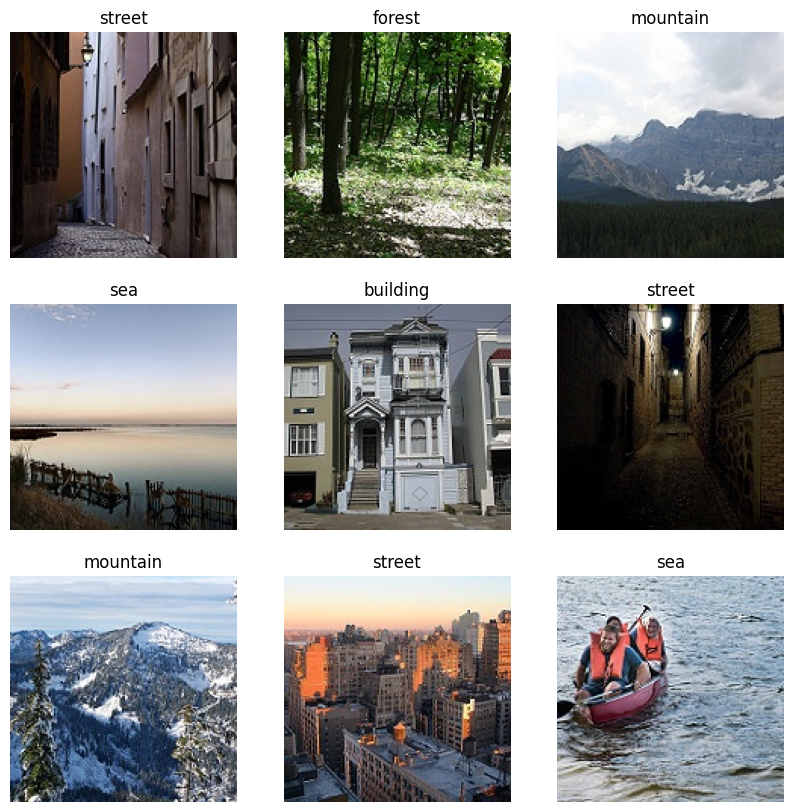

In [5]:
for i in range(0,90,9):
    make_predictions(i)